# TACO Inspection Demo

This notebook contains several independent scripts that show how to load and visualize the dataset stats and annotated images:
- Section 1 shows the dataset stats
- Section 2 show the class hierarchical structure: super classes and classes
- Section 3 shows TACO images along with their segmentation masks

But first we need to load the annotations and some python libraries:

In [1]:
%matplotlib inline
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from pycocotools.coco import COCO
from PIL import Image, ExifTags
import torch
import random
from torchvision import transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import DataLoader
from matplotlib.patches import Polygon, Rectangle


In [44]:

#dataset_path = './data'
dataset_path = '/dtu/datasets1/02514/data_wastedetection'

anns_file_path = dataset_path + '/' + 'annotations.json'

# Read annotations
with open(anns_file_path, 'r') as f:
    dataset = json.loads(f.read())

categories = dataset['categories']
anns = dataset['annotations']
imgs = dataset['images']
nr_cats = len(categories)
nr_annotations = len(anns)
nr_images = len(imgs)

# Load categories and super categories
cat_names = []
super_cat_names = []
super_cat_ids = {}
super_cat_last_name = ''
nr_super_cats = 0
for cat_it in categories:
    cat_names.append(cat_it['name'])
    super_cat_name = cat_it['supercategory']
    # Adding new supercat
    if super_cat_name != super_cat_last_name:
        super_cat_names.append(super_cat_name)
        super_cat_ids[super_cat_name] = nr_super_cats
        super_cat_last_name = super_cat_name
        nr_super_cats += 1

print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)

Number of super categories: 28
Number of categories: 60
Number of annotations: 4784
Number of images: 1500


In [45]:
dataset.keys()

dict_keys(['info', 'images', 'annotations', 'scene_annotations', 'licenses', 'categories', 'scene_categories'])

We are going to use the supercategories:
- X = images
- y = annotations

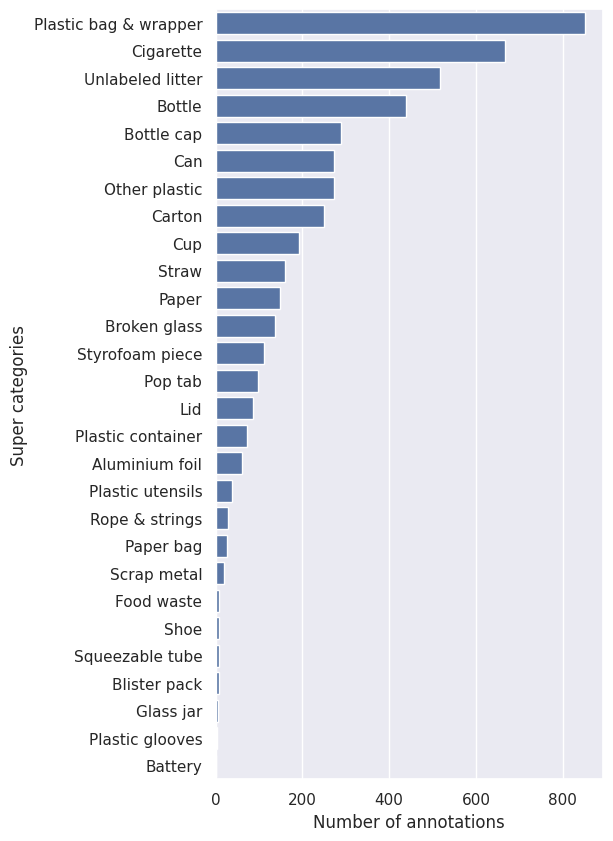

In [46]:
cat_ids_2_supercat_ids = {}
for cat in categories:
    cat_ids_2_supercat_ids[cat['id']] = super_cat_ids[cat['supercategory']]

# Count annotations
super_cat_histogram = np.zeros(nr_super_cats,dtype=int)
for ann in anns:
    cat_id = ann['category_id']
    super_cat_histogram[cat_ids_2_supercat_ids[cat_id]] +=1
    
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,10))

# Convert to DataFrame
d ={'Super categories': super_cat_names, 'Number of annotations': super_cat_histogram}
df = pd.DataFrame(d)
df = df.sort_values('Number of annotations', axis=0, ascending=False)

# sns.set_color_codes("pastel")
# sns.set(style="whitegrid")
plot_1 = sns.barplot(x="Number of annotations", y="Super categories", data=df,
            label="Total", color="b")
#plot_1.set_title('Annotations per super category',fontsize=20)   

## 3. Visualize Annotated Images

For simplicity, to select and show the dataset images with the respective masks, we make use of the COCO API.
The script below shows how to load and visualize an image with all its annotations.

Unfortunately, several python libraries do not take into account the EXIF orientation tag, thus we have to explicitly rotate the images. Alternatively you can use instead OpenCV.

In [48]:
img_id

642

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
batch_15/000041.jpg


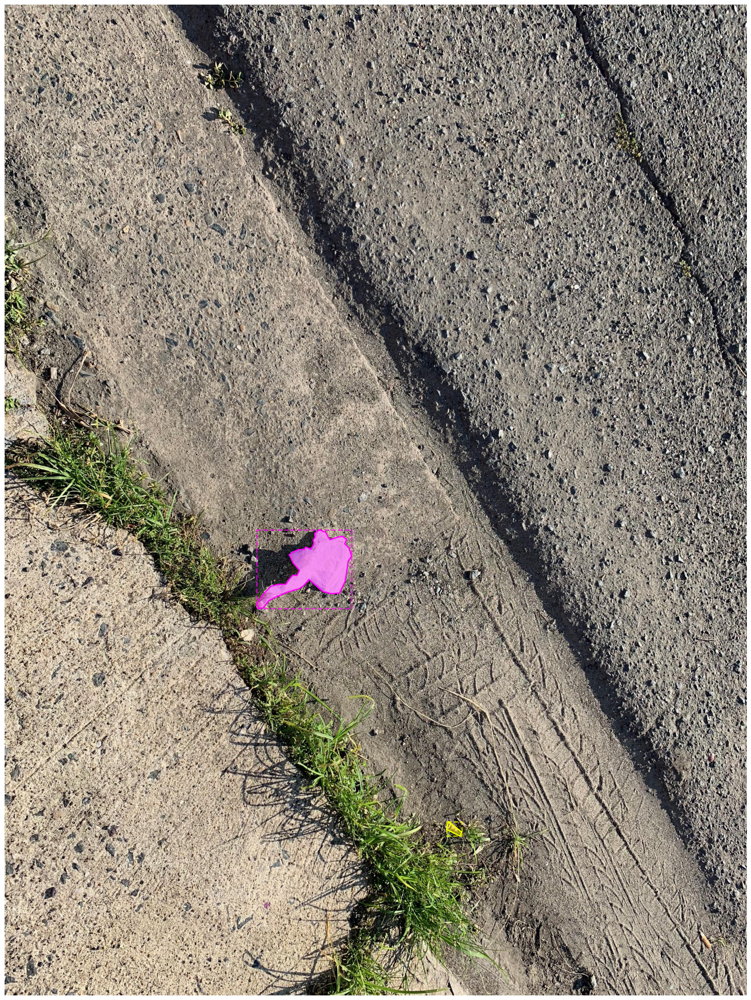

In [47]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

# User settings
image_filepath = 'batch_15/000041.jpg'#'batch_11/000028.jpg'
pylab.rcParams['figure.figsize'] = (28,28)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Find image id
img_id = -1
for img in imgs:
    if img['file_name'] == image_filepath:
        img_id = img['id']
        break

# Show image and corresponding annotations
if img_id == -1:
    print('Incorrect file name')
else:

    # Load image
    print(image_filepath)
    I = Image.open(dataset_path + '/' + image_filepath)

    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)

    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img_id, catIds=[], iscrowd=None)
    anns_sel = coco.loadAnns(annIds)

    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)

    plt.show()



# The task


The task is to first get bounding boxes and the classify them

We need:
1. A dataloader
2. Object proposals
3. Classifier
4. Evaluation


In [4]:
dataset.keys()

dict_keys(['info', 'images', 'annotations', 'scene_annotations', 'licenses', 'categories', 'scene_categories'])

## Dataloader

so we want for supercategories:
- the image_paths
- the bounding boxes
- the category for the bounding boxes

In [22]:
dataset_path = '/dtu/datasets1/02514/data_wastedetection'

anns_file_path = dataset_path + '/' + 'annotations.json'


In [26]:
# image paths
image_paths = [(img_id, img_data['file_name']) for img_id, img_data in enumerate(dataset['images'])]
coco = COCO(anns_file_path)

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break


loading annotations into memory...
Done (t=0.06s)
creating index...
index created!


In [27]:
# for get item
idx = 0

In [ ]:
# TODO: transform???

In [32]:
img_id, img_path = image_paths[idx]
I = Image.open(dataset_path + '/' + img_path)
# Load and process image metadata
if I._getexif():
    exif = dict(I._getexif().items())
    # Rotate portrait and upside down images if necessary
    if orientation in exif:
        if exif[orientation] == 3:
            I = I.rotate(180,expand=True)
        if exif[orientation] == 6:
            I = I.rotate(270,expand=True)
        if exif[orientation] == 8:
            I = I.rotate(90,expand=True)
annIds = coco.getAnnIds(imgIds=img_id, catIds=[], iscrowd=None)
torch.stack([torch.tensor(my_scalar)] + [torch.tensor(item) for item in my_list])


KeyError: ('category_id', 'bbox')

In [113]:
idx = 0

In [116]:

img_size = (1024, 1024)
# Define transforms for training
transform = A.Compose([
    A.Resize(img_size[0], img_size[1]),
    ToTensorV2(),
], bbox_params=A.BboxParams(format='coco', label_fields=['categories']), is_check_shapes=False)

In [118]:
img_id, img_path = image_paths[idx]
# Load and process image metadata
I = Image.open(data_path + '/' + img_path)
if I._getexif():
    exif = dict(I._getexif().items())
    # Rotate portrait and upside down images if necessary
    if orientation in exif:
        if exif[orientation] == 3:
            I = I.rotate(180,expand=True)
        if exif[orientation] == 6:
            I = I.rotate(270,expand=True)
        if exif[orientation] == 8:
            I = I.rotate(90,expand=True)
image = np.array(I) / 255 
image = image.astype(np.float32)

# BBOX AND LABEL
super_categories, bboxes = zip(*[(item['category_id'], item['bbox']) for item in coco.loadAnns(img_id)])
# TRANSFORM
transformed = transform(image=image, bboxes = bboxes, categories = super_categories)#, bbox=?)
X = transformed['image']
y = torch.stack(transformed['categories'], transformed['bboxes'])

TypeError: expected Tensor as element 0 in argument 0, but got int

In [119]:
transformed['categories']


[33]

In [120]:
transformed['bboxes']

[(217.6, 598.6461538461539, 61.70256410256408, 75.32307692307688)]

In [62]:
dataset['images']

[{'id': 0,
  'width': 1537,
  'height': 2049,
  'file_name': 'batch_1/000006.jpg',
  'license': None,
  'flickr_url': 'https://farm66.staticflickr.com/65535/33978196618_e30a59e0a8_o.png',
  'coco_url': None,
  'date_captured': None,
  'flickr_640_url': 'https://farm66.staticflickr.com/65535/33978196618_632623b4fc_z.jpg'},
 {'id': 1,
  'width': 1537,
  'height': 2049,
  'file_name': 'batch_1/000008.jpg',
  'license': None,
  'flickr_url': 'https://farm66.staticflickr.com/65535/47803331152_ee00755a2e_o.png',
  'coco_url': None,
  'date_captured': None,
  'flickr_640_url': 'https://farm66.staticflickr.com/65535/47803331152_19beae025a_z.jpg'},
 {'id': 2,
  'width': 1537,
  'height': 2049,
  'file_name': 'batch_1/000010.jpg',
  'license': None,
  'flickr_url': 'https://farm66.staticflickr.com/65535/40888872753_08ffb24902_o.png',
  'coco_url': None,
  'date_captured': None,
  'flickr_640_url': 'https://farm66.staticflickr.com/65535/40888872753_631ab0f441_z.jpg'},
 {'id': 3,
  'width': 2049,


In [14]:

## Dataset classes - PH2
class TACO_dataset(torch.utils.data.Dataset):
    def __init__(self, mode, transform, data_path='/dtu/datasets1/02514/data_wastedetection', seed=420):
        # Initialization
        #data_path = '/Users/arond.jacobsen/Desktop/DTU/8_semester/02514_Deep_Learning_in_Computer_Vision/2_part/0_project/sample_data/PH2_Dataset_images'
        
        self.transform = transform
        # Read annotations
        self.data_path = data_path
        anns_file_path = self.data_path + '/' + 'annotations.json'
        self.coco = COCO(anns_file_path)
        with open(anns_file_path, 'r') as f:
            dataset = json.loads(f.read())
        # get image id and paths
        self.image_paths = [(self.coco.getAnnIds(imgIds=img_data['id'], catIds=[], iscrowd=None), img_data['file_name']) for img_data in dataset['images']]
        # shuffle     
        random.seed(seed)
        #random.shuffle(image_paths)
        
        
        # Obtain Exif orientation tag code
        for orientation in ExifTags.TAGS.keys():
            if ExifTags.TAGS[orientation] == 'Orientation':
                self.orientation = orientation
                break
        
        # todo: category id to label
        

        train_size = int(0.7 * len(self.image_paths))
        val_size = int(0.1 * len(self.image_paths))

        if mode == 'train':
            self.image_paths = self.image_paths[:train_size]

        elif mode == 'val':
            self.image_paths = self.image_paths[train_size:train_size+val_size]

        elif mode == 'test':
            self.image_paths = self.image_paths[train_size+val_size:]

        else:
            raise ValueError('mode must be one of train, val or test')

        
    def __len__(self):
        'Returns the total number of samples'
        return len(self.image_paths)

    def __getitem__(self, idx):
        # IMAGE
        # load ids
        anno_id, img_path = self.image_paths[idx]
        # Load and process image metadata
        image = Image.open(self.data_path + '/' + img_path)
        if image._getexif():
            exif = dict(image._getexif().items())
            # Rotate portrait and upside down images if necessary
            if self.orientation in exif:
                if exif[self.orientation] == 3:
                    image = image.rotate(180,expand=True)
                if exif[self.orientation] == 6:
                    image = image.rotate(270,expand=True)
                if exif[self.orientation] == 8:
                    image = image.rotate(90,expand=True)
                    
        image = np.array(image) / 255 
        image = image.astype(np.float32)
        # BBOX AND LABEL
        # Load mask ids
        category_ids, bboxes = zip(*[(item['category_id'], item['bbox']) for item in self.coco.loadAnns(anno_id)])
        
        
        # TRANSFORM
        transformed = self.transform(image=image, bboxes = bboxes, category_ids = category_ids)#, bbox=?)
        return transformed['image'], transformed['category_ids'], transformed['bboxes']



In [15]:
data_path = '/dtu/datasets1/02514/data_wastedetection'


In [16]:
# Get normalization constants
# TODO!!
#train_mean, train_std = get_normalization_constants(root=args.data_path, seed=args.seed)

img_size = (1024, 1024)
# Define transforms for training
train_transform = A.Compose([
    A.Resize(img_size[0], img_size[1]),
    ToTensorV2(),
], bbox_params=A.BboxParams(format='coco', label_fields=['category_ids']), is_check_shapes=False)

In [25]:
batch_size = 2
num_workers = 1
trainset = TACO_dataset(mode='train', transform=train_transform)
train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=num_workers, collate_fn=lambda x: x)



loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


In [26]:
for batch in train_loader:
    #
    break

(tensor([[[0.2438, 0.2329, 0.3609,  ..., 0.2959, 0.2598, 0.2928],
          [0.2173, 0.2940, 0.4159,  ..., 0.2982, 0.3052, 0.2899],
          [0.2883, 0.3332, 0.3552,  ..., 0.3119, 0.3034, 0.3140],
          ...,
          [0.1637, 0.1630, 0.2821,  ..., 0.3219, 0.2500, 0.2608],
          [0.2045, 0.2105, 0.3477,  ..., 0.2016, 0.1552, 0.1260],
          [0.2045, 0.2526, 0.2971,  ..., 0.2092, 0.1923, 0.2404]],
 
         [[0.2477, 0.2368, 0.3648,  ..., 0.2959, 0.2598, 0.2928],
          [0.2212, 0.2979, 0.4198,  ..., 0.2982, 0.3052, 0.2899],
          [0.2922, 0.3371, 0.3591,  ..., 0.3119, 0.3034, 0.3140],
          ...,
          [0.1715, 0.1708, 0.2899,  ..., 0.3297, 0.2579, 0.2686],
          [0.2123, 0.2184, 0.3556,  ..., 0.2094, 0.1630, 0.1338],
          [0.2144, 0.2625, 0.3070,  ..., 0.2171, 0.2001, 0.2483]],
 
         [[0.2556, 0.2446, 0.3727,  ..., 0.3038, 0.2676, 0.3007],
          [0.2291, 0.3058, 0.4276,  ..., 0.3061, 0.3131, 0.2977],
          [0.3000, 0.3449, 0.3670,  ...,

In [214]:
X

(tensor([[[0.4373, 0.4000, 0.4247,  ..., 0.2940, 0.2978, 0.2737],
          [0.3158, 0.3622, 0.3784,  ..., 0.2817, 0.2893, 0.2834],
          [0.3016, 0.3181, 0.3377,  ..., 0.2719, 0.2644, 0.2715],
          ...,
          [0.3091, 0.3908, 0.4165,  ..., 0.3628, 0.4456, 0.4749],
          [0.4182, 0.3930, 0.4220,  ..., 0.4658, 0.5053, 0.5167],
          [0.3862, 0.3338, 0.3033,  ..., 0.4439, 0.5044, 0.5482]],
 
         [[0.4843, 0.4471, 0.4757,  ..., 0.3884, 0.3958, 0.3796],
          [0.3629, 0.4093, 0.4294,  ..., 0.3760, 0.3874, 0.3893],
          [0.3487, 0.3652, 0.3887,  ..., 0.3653, 0.3624, 0.3774],
          ...,
          [0.2425, 0.3242, 0.3499,  ..., 0.2881, 0.3671, 0.3926],
          [0.3515, 0.3263, 0.3553,  ..., 0.3911, 0.4268, 0.4344],
          [0.3195, 0.2671, 0.2366,  ..., 0.3691, 0.4260, 0.4659]],
 
         [[0.5785, 0.5334, 0.5465,  ..., 0.3648, 0.3723, 0.3521],
          [0.4570, 0.4955, 0.5002,  ..., 0.3525, 0.3638, 0.3618],
          [0.4428, 0.4515, 0.4595,  ...,

In [215]:
len(X)

2

In [216]:
y

(tensor([[[0.6200, 0.6082, 0.5993,  ..., 0.1784, 0.1303, 0.1193],
          [0.6620, 0.6342, 0.6028,  ..., 0.1933, 0.1546, 0.1166],
          [0.6350, 0.6255, 0.6345,  ..., 0.5384, 0.2359, 0.1726],
          ...,
          [0.6361, 0.6233, 0.6195,  ..., 0.7451, 0.7393, 0.7594],
          [0.6140, 0.5870, 0.6226,  ..., 0.7627, 0.7363, 0.7650],
          [0.5473, 0.5479, 0.5874,  ..., 0.7738, 0.7430, 0.7484]],
 
         [[0.6082, 0.5965, 0.5915,  ..., 0.1274, 0.0911, 0.0916],
          [0.6503, 0.6263, 0.5989,  ..., 0.1347, 0.1018, 0.0712],
          [0.6231, 0.6177, 0.6306,  ..., 0.4708, 0.1694, 0.0967],
          ...,
          [0.6164, 0.6077, 0.6038,  ..., 0.6000, 0.5942, 0.6143],
          [0.5964, 0.5735, 0.6083,  ..., 0.6176, 0.5912, 0.6199],
          [0.5298, 0.5345, 0.5730,  ..., 0.6287, 0.5979, 0.6033]],
 
         [[0.2319, 0.2161, 0.1902,  ..., 0.0556, 0.0472, 0.0602],
          [0.2699, 0.2314, 0.1828,  ..., 0.0464, 0.0435, 0.0334],
          [0.2519, 0.2169, 0.2070,  ...,

In [86]:
data_path = '/dtu/datasets1/02514/data_wastedetection'
anns_file_path = data_path + '/' + 'annotations.json'
coco = COCO(anns_file_path)
with open(anns_file_path, 'r') as f:
    dataset = json.loads(f.read())

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!


In [80]:
image_paths = [(img_data['id'], img_data['file_name']) for img_data in dataset['images']]
image_paths[642]

(642, 'batch_15/000041.jpg')